<div style='text-align: center; padding: 40px 20px; background: linear-gradient(135deg, #e8f5e9 0%, #a5d6a7 100%); border-radius: 15px;'>
    <h1 style='color: #003366; font-size: 36px; margin-bottom: 10px;'>Clasificacion de Enfermedades en Hojas de Yuca</h1>
    <h2 style='color: #2e7d32; font-size: 24px; margin-bottom: 20px;'>Vision por Computadora · Clasificacion multiclase</h2>
    <hr style='border: 2px solid #003366; width: 50%;'>
    <p style='color: #003366; font-size: 20px; margin-top: 20px;'><strong>Javier Ramirez</strong></p>
    <p style='color: #666; font-size: 16px;'>CICESE · Reconocimiento de Patrones</p>
</div>

In [1]:
import os, sys, subprocess, shutil, random
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from IPython.display import display

RAIZ = Path.cwd()
while not (RAIZ / 'data').exists() and RAIZ != RAIZ.parent:
    RAIZ = RAIZ.parent
os.chdir(RAIZ)
DATA = RAIZ / 'data'
SPLITS = DATA / 'splits'
CLASES = ['bacterial_blight', 'brown_streak_disease', 'green_mottle',
          'healthy', 'mosaic_disease']

plt.rcParams['figure.figsize'] = (12, 4)
plt.rcParams['axes.grid'] = True
np.random.seed(42)

## Datos

In [2]:
def contar_por_clase(carpeta):
    return {c: len(list((carpeta / c).glob('*.jpg'))) for c in CLASES}

conteos_train = contar_por_clase(DATA / 'train')
total_train = sum(conteos_train.values())
n_test = len(list((DATA / 'test').glob('*.jpg')))

tabla_clases = pd.DataFrame({
    'clase': CLASES,
    'imagenes': [conteos_train[c] for c in CLASES],
    '%': [round(100 * conteos_train[c] / total_train, 2) for c in CLASES],
})
display(tabla_clases)
print(f'Train: {total_train} | Test externo: {n_test}')

,clase,imagenes,%
0,bacterial_blight,924,5.17
1,brown_streak_disease,1861,10.42
2,green_mottle,2029,11.36
3,healthy,2191,12.26
4,mosaic_disease,10859,60.79


Train: 17864 | Test externo: 3207


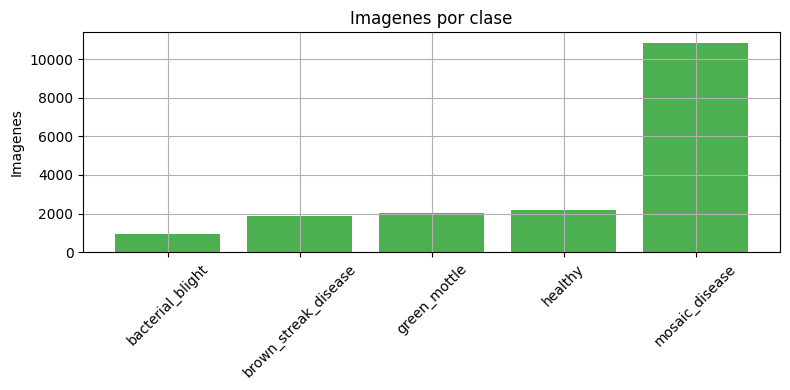

In [3]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(tabla_clases['clase'], tabla_clases['imagenes'], color='#4CAF50')
ax.set_title('Imagenes por clase')
ax.set_ylabel('Imagenes')
ax.tick_params(axis='x', rotation=45)
fig.tight_layout()
plt.show()

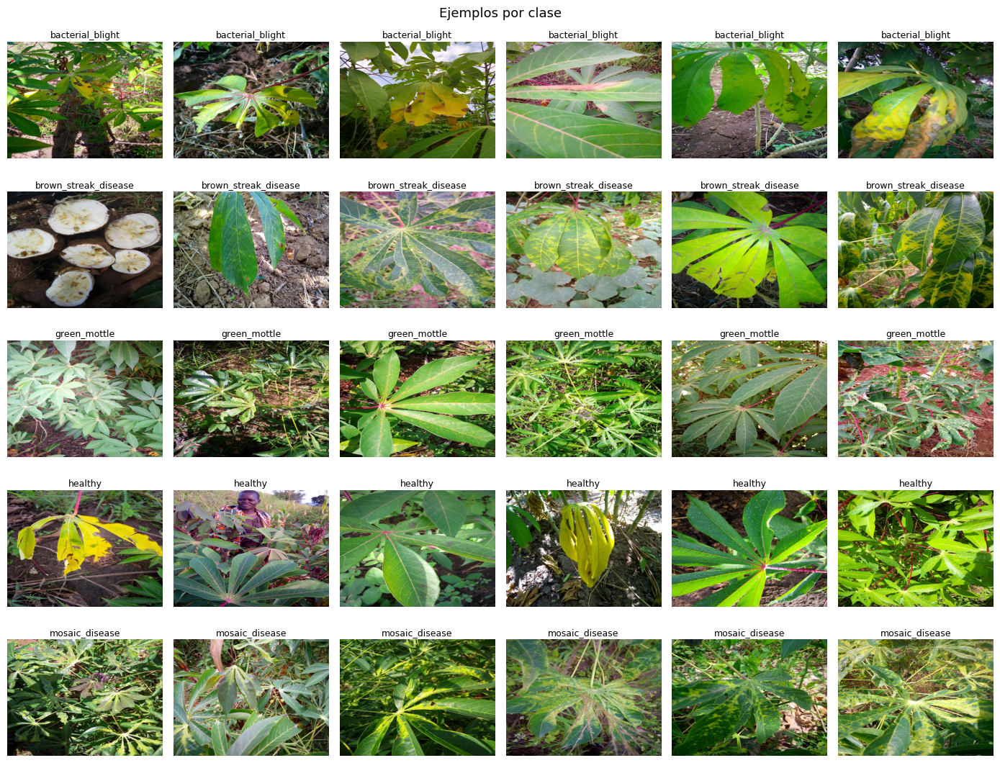

In [4]:
fig, axs = plt.subplots(len(CLASES), 6, figsize=(14, 11))
for i, c in enumerate(CLASES):
    archivos = sorted((DATA / 'train' / c).glob('*.jpg'))
    idx = np.linspace(0, len(archivos) - 1, 6, dtype=int)
    for j, k in enumerate(idx):
        axs[i, j].imshow(Image.open(archivos[k]))
        axs[i, j].axis('off')
        axs[i, j].set_title(c, fontsize=9, pad=4)
fig.suptitle('Ejemplos por clase', fontsize=13)
fig.tight_layout()
plt.show()

## Preprocesamiento

Tensor: (3, 224, 224) torch.float32


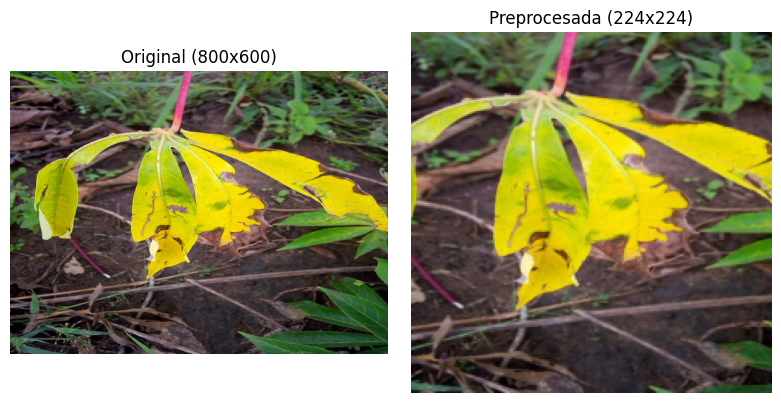

In [5]:
# ImageNet ref
MEDIA = [0.485, 0.456, 0.406]
DESV = [0.229, 0.224, 0.225]

def tf_val():
    return transforms.Compose([
        transforms.Resize(256), transforms.CenterCrop(224),
        transforms.ToTensor(), transforms.Normalize(MEDIA, DESV)])

def tf_train():
    return transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(0.6, 1.0)),
        transforms.RandomHorizontalFlip(), transforms.RandomVerticalFlip(p=0.3),
        transforms.RandomRotation(25),
        transforms.ColorJitter(brightness=0.3, contrast=0.3,
                               saturation=0.3, hue=0.1),
        transforms.RandomGrayscale(p=0.05),
        transforms.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0)),
        transforms.ToTensor(), transforms.Normalize(MEDIA, DESV)])

def desnorm():
    return transforms.Normalize(
        mean=[-m/s for m, s in zip(MEDIA, DESV)],
        std=[1/s for s in DESV])

p = sorted((DATA / 'train' / 'healthy').glob('*.jpg'))[0]
original = Image.open(p)
tensor = tf_val()(original)
print('Tensor:', tuple(tensor.shape), tensor.dtype)
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].imshow(original); axs[0].set_title('Original (800x600)'); axs[0].axis('off')
axs[1].imshow(desnorm()(tensor).permute(1,2,0).clip(0,1))
axs[1].set_title('Preprocesada (224x224)'); axs[1].axis('off')
fig.tight_layout(); plt.show()

## Splits

In [6]:
if not (SPLITS / 'split_principal.csv').exists():
    subprocess.run([sys.executable, 'generar_splits.py', '--con-test', '0.10'],
                   cwd=str(RAIZ), check=True)

sp = pd.read_csv(SPLITS / 'split_principal.csv')
display(sp['split'].value_counts().sort_index())

split
test      1787
train    12504
val       3573
Name: count, dtype: int64

### Balanceo (undersampling)

In [83]:
MAX_POR_CLASE = 2000

def balancear_split(csv_path, max_n=MAX_POR_CLASE):
    df = pd.read_csv(csv_path)
    balanceado = []
    for split, grupo in df.groupby('split'):
        if split == 'train':
            for clase, sub in grupo.groupby('label'):
                if len(sub) > max_n:
                    balanceado.append(sub.sample(max_n, random_state=42))
                else:
                    balanceado.append(sub)
        else:
            balanceado.append(grupo)
    return pd.concat(balanceado).reset_index(drop=True)

sp_bal = balancear_split(SPLITS / 'split_principal.csv')
sp_bal.to_csv(SPLITS / 'split_balanceado.csv', index=False)
print('Antes:')
print(pd.read_csv(SPLITS / 'split_principal.csv')['label'].value_counts().to_string())
print()
print('Después (train):')
print(sp_bal[sp_bal['split']=='train']['label'].value_counts().to_string())

Antes:
label
mosaic_disease          10859
healthy                  2191
green_mottle             2029
brown_streak_disease     1861
bacterial_blight          924

Después (train):
label
mosaic_disease          2000
healthy                 1534
green_mottle            1420
brown_streak_disease    1303
bacterial_blight         646


## Baseline (clásicos)

In [36]:
from skimage.feature import hog, local_binary_pattern
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

MAX_ML = 2000

def extraer_features(ruta, sz=(64, 64)):
    img = Image.open(ruta).convert('RGB').resize(sz)
    arr = np.array(img) / 255.0
    gray = np.mean(arr, axis=2)
    hog_feat = hog(gray, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), feature_vector=True)
    hist_r = np.histogram(arr[:,:,0], bins=32, range=(0, 1))[0]
    hist_g = np.histogram(arr[:,:,1], bins=32, range=(0, 1))[0]
    hist_b = np.histogram(arr[:,:,2], bins=32, range=(0, 1))[0]
    lbp = local_binary_pattern(gray, P=8, R=1, method='uniform')
    hist_lbp = np.histogram(lbp, bins=10, range=(0, 10))[0]
    stats = np.concatenate([arr.mean(axis=(0,1)), arr.std(axis=(0,1))])
    return np.concatenate([hog_feat, hist_r, hist_g, hist_b, hist_lbp, stats])

idx_clase = {c: i for i, c in enumerate(CLASES)}
sp_ml = pd.read_csv(SPLITS / 'split_balanceado.csv') if (SPLITS / 'split_balanceado.csv').exists() else sp

def cargar_split_ml(split_name):
    sub = sp_ml[sp_ml['split'] == split_name].copy()
    if split_name == 'train' and len(sub) > MAX_ML:
        parts = []
        for _, g in sub.groupby('label'):
            parts.append(g.sample(min(len(g), MAX_ML // len(CLASES)), random_state=42))
        sub = pd.concat(parts)
    X, y = [], []
    for _, row in sub.iterrows():
        X.append(extraer_features(DATA / row['ruta']))
        y.append(idx_clase[row['label']])
    return np.array(X), np.array(y)

print('Extrayendo features del train...')
X_train_ml, y_train_ml = cargar_split_ml('train')
print('Extrayendo features del val...')
X_val_ml, y_val_ml = cargar_split_ml('val')
print('Extrayendo features del test...')
X_test_ml, y_test_ml = cargar_split_ml('test')
print(f'Train: {len(y_train_ml)} | Val: {len(y_val_ml)} | Test: {len(y_test_ml)}')

Extrayendo features train...


/home/jabonsote/miniconda3/envs/vjepa2-312/lib/python3.12/site-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Extrayendo features val...


/home/jabonsote/miniconda3/envs/vjepa2-312/lib/python3.12/site-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Extrayendo features test...


/home/jabonsote/miniconda3/envs/vjepa2-312/lib/python3.12/site-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Train: 2000 | Val: 3573 | Test: 1787



--- SVM (RBF) ---
  Val:  acc=0.413 | f1_macro=0.301
  Test: acc=0.418 | f1_macro=0.312


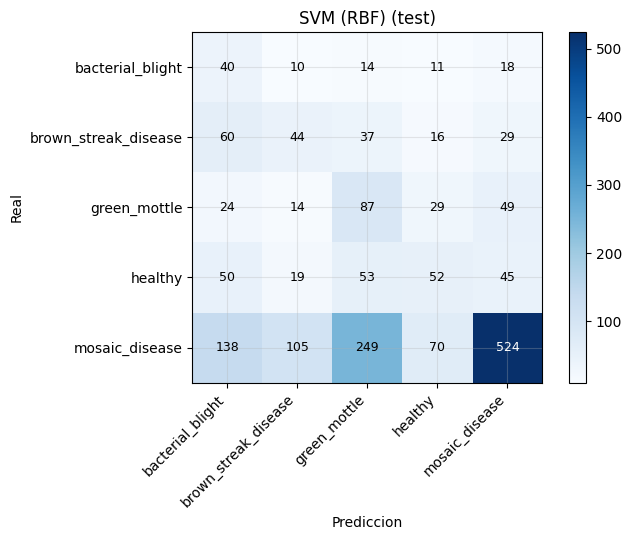


--- Random Forest ---
  Val:  acc=0.387 | f1_macro=0.276
  Test: acc=0.397 | f1_macro=0.284


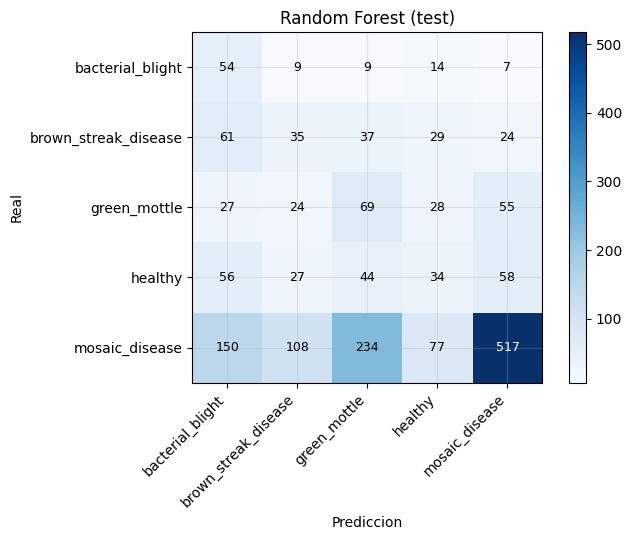

,val_acc,val_f1_macro,test_acc,test_f1_macro
SVM (RBF),0.4125,0.3005,0.4180,0.3123
Random Forest,0.3865,0.2755,0.3968,0.2836


In [38]:
modelos_ml = {
    'SVM (RBF)': SVC(kernel='rbf', C=10, gamma='scale', random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=200, max_depth=30, random_state=42, n_jobs=-1),
}

resultados_ml = {}
for nombre, modelo in modelos_ml.items():
    print(f'\n--- {nombre} ---')
    modelo.fit(X_train_ml, y_train_ml)
    y_pv = modelo.predict(X_val_ml)
    y_pt = modelo.predict(X_test_ml)
    acc_v, f1_v = accuracy_score(y_val_ml, y_pv), f1_score(y_val_ml, y_pv, average='macro', zero_division=0)
    acc_t, f1_t = accuracy_score(y_test_ml, y_pt), f1_score(y_test_ml, y_pt, average='macro', zero_division=0)
    resultados_ml[nombre] = {'val_acc': acc_v, 'val_f1': f1_v, 'test_acc': acc_t, 'test_f1': f1_t}
    print(f'  Val:  acc={acc_v:.3f} | f1_macro={f1_v:.3f}')
    print(f'  Test: acc={acc_t:.3f} | f1_macro={f1_t:.3f}')
    cm = confusion_matrix(y_test_ml, y_pt)
    fig, ax = plt.subplots(figsize=(7, 5.5))
    im = ax.imshow(cm, cmap='Blues')
    ax.set_xticks(range(len(CLASES)), CLASES, rotation=45, ha='right')
    ax.set_yticks(range(len(CLASES)), CLASES)
    for i in range(len(CLASES)):
        for j in range(len(CLASES)):
            ax.text(j, i, int(cm[i,j]), ha='center', va='center',
                    color='white' if cm[i,j] > cm.max()/2 else 'black', fontsize=9)
    ax.set_title(f'{nombre} (test)')
    ax.set_xlabel('Prediccion'); ax.set_ylabel('Real')
    fig.colorbar(im, ax=ax, fraction=0.046)
    fig.tight_layout(); plt.show()

df_ml = pd.DataFrame(resultados_ml).T
df_ml.columns = ['val_acc', 'val_f1_macro', 'test_acc', 'test_f1_macro']
display(df_ml.round(4))

## Utilidades DL

In [7]:
import cv2
import torchvision
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from sklearn.metrics import precision_recall_fscore_support

def segmentar_hoja(img):
    arr = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(arr, (25, 20, 20), (90, 255, 255))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((7,7), np.uint8))
    contornos, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contornos: return img
    c = max(contornos, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(c)
    pad = int(max(w, h) * 0.1)
    return img.crop((max(0,x-pad), max(0,y-pad), min(img.width,x+w+pad), min(img.height,y+h+pad)))

class ConjuntoCSV(Dataset):
    def __init__(self, muestras, transform, segmentar=False):
        self.muestras, self.transform, self.segmentar = muestras, transform, segmentar
    def __len__(self): return len(self.muestras)
    def __getitem__(self, i):
        ruta, idx = self.muestras[i]
        img = Image.open(ruta).convert('RGB')
        if self.segmentar: img = segmentar_hoja(img)
        return self.transform(img), idx

class BalancedConjuntoCSV(Dataset):
    def __init__(self, muestras, transform, segmentar=False):
        por_clase = {}
        for r, l in muestras:
            por_clase.setdefault(l, []).append((r, l))
        max_n = max(len(v) for v in por_clase.values())
        self.muestras = []
        for items in por_clase.values():
            self.muestras.extend(items * (max_n // len(items)) + items[:max_n % len(items)])
        random.shuffle(self.muestras)
        self.transform, self.segmentar = transform, segmentar
    def __len__(self): return len(self.muestras)
    def __getitem__(self, i):
        ruta, idx = self.muestras[i]
        img = Image.open(ruta).convert('RGB')
        if self.segmentar: img = segmentar_hoja(img)
        return self.transform(img), idx

def cargar_splits(splits):
    df = pd.read_csv(splits)
    clases = sorted(df['label'].unique())
    idx_c = {c: i for i, c in enumerate(clases)}
    def por(split):
        sub = df[df['split'] == split]
        return [(DATA / r, idx_c[l]) for r, l in zip(sub['ruta'], sub['label'])]
    return clases, por('train'), por('val'), por('test') if 'test' in set(df['split']) else []

def graficar_confusion(cm, clases, nombre, ruta):
    fig, ax = plt.subplots(figsize=(8, 6.5))
    im = ax.imshow(cm, cmap='Blues')
    ax.set_xticks(range(len(clases)), clases, rotation=45, ha='right')
    ax.set_yticks(range(len(clases)), clases)
    for i in range(len(clases)):
        for j in range(len(clases)):
            ax.text(j, i, int(cm[i,j]), ha='center', va='center',
                    color='white' if cm[i,j] > cm.max()/2 else 'black', fontsize=9)
    ax.set_xlabel('Prediccion'); ax.set_ylabel('Real')
    fig.colorbar(im, ax=ax, fraction=0.046)
    fig.tight_layout(); fig.savefig(ruta, dpi=150); plt.close(fig)

def evaluar(model, muestras, clases, split, tf, device, salidas):
    loader = DataLoader(ConjuntoCSV(muestras, tf), batch_size=64,
                        shuffle=False, num_workers=4, persistent_workers=True)
    model.eval(); yt, yp = [], []
    with torch.no_grad():
        for imgs, labs in tqdm(loader, desc=f'eval {split}'):
            imgs = imgs.to(device)
            yt.extend(labs.tolist()); yp.extend(model(imgs).argmax(1).cpu().tolist())
    cm = confusion_matrix(yt, yp, labels=list(range(len(clases))))
    graficar_confusion(cm, clases, split, salidas / f'matriz_{split}.png')
    acc = accuracy_score(yt, yp)
    p, r, f1, _ = precision_recall_fscore_support(yt, yp, average='macro', zero_division=0)
    _, _, f1w, _ = precision_recall_fscore_support(yt, yp, average='weighted', zero_division=0)
    p_c, r_c, f1_c, _ = precision_recall_fscore_support(yt, yp, average=None, zero_division=0)
    pd.DataFrame({'clase': clases + ['exactitud', 'f1_macro', 'f1_ponderado'],
                  'precision': list(p_c)+[acc,p,p], 'recall': list(r_c)+[acc,r,r],
                  'f1': list(f1_c)+[acc,f1,f1w]}).to_csv(salidas / f'metricas_{split}.csv', index=False)
    print(f'  {split}: acc={acc:.3f} f1_macro={f1:.3f}')

def entrenar_timm(nombre_modelo, salidas, pesos, epochs=30, batch_size=64,
                  lr=3e-4, segmentar=False, semilla=42):
    import timm
    salidas, pesos = Path(salidas), Path(pesos)
    salidas.mkdir(parents=True, exist_ok=True); pesos.mkdir(parents=True, exist_ok=True)
    random.seed(semilla); np.random.seed(semilla); torch.manual_seed(semilla)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'Device: {device} | Modelo: {nombre_modelo} | Seg: {segmentar}')
    spl = SPLITS / 'split_balanceado.csv' if (SPLITS / 'split_balanceado.csv').exists() else SPLITS / 'split_principal.csv'
    clases, m_train, m_val, m_test = cargar_splits(spl)
    gen = torch.Generator().manual_seed(semilla)
    train_loader = DataLoader(BalancedConjuntoCSV(m_train, tf_train(), segmentar), batch_size=batch_size,
                              shuffle=True, num_workers=4, persistent_workers=True, generator=gen)
    val_loader = DataLoader(ConjuntoCSV(m_val, tf_val()), batch_size=batch_size,
                            shuffle=False, num_workers=4, persistent_workers=True)
    model = timm.create_model(nombre_modelo, pretrained=True, num_classes=len(clases)).to(device)
    print(f'Parametros: {sum(p.numel() for p in model.parameters())/1e6:.2f}M')
    optim = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    sched = torch.optim.lr_scheduler.LambdaLR(optim, lambda ep: (ep+1)/1 if ep<1 else 0.5*(1+np.cos(np.pi*(ep-1)/max(1,epochs-1))))
    conteo = np.bincount([i for _,i in m_train], minlength=len(clases))
    pesos_cl = torch.tensor(len(m_train)/(len(clases)*conteo), dtype=torch.float32).to(device)
    criterio = nn.CrossEntropyLoss(weight=pesos_cl, label_smoothing=0.1)
    usar_amp = device.type == 'cuda'
    scaler = torch.amp.GradScaler('cuda', enabled=usar_amp) if usar_amp else None
    historial, mejor_f1, sin_mej = [], 0.0, 0
    for ep in range(epochs):
        lr_act = sched.get_last_lr()[0]
        print(f'Epoch {ep+1}/{epochs} | lr {lr_act:.2e}')
        model.train(); perd, n, acert = 0.0, 0, 0
        for imgs, labs in tqdm(train_loader, desc=f'{ep+1}/{epochs} [train]'):
            imgs, labs = imgs.to(device), labs.to(device)
            optim.zero_grad(set_to_none=True)
            with torch.amp.autocast('cuda', enabled=usar_amp): loss = criterio(model(imgs), labs)
            if usar_amp: scaler.scale(loss).backward(); scaler.unscale_(optim)
            else: loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            if usar_amp: scaler.step(optim); scaler.update()
            else: optim.step()
            perd += loss.item()*len(labs); acert += (model(imgs).argmax(1)==labs).sum().item(); n += len(labs)
        model.eval(); vp, vn = 0.0, 0; yt, yp = [], []
        with torch.no_grad():
            for imgs, labs in tqdm(val_loader, leave=False):
                imgs, labs = imgs.to(device), labs.to(device)
                with torch.amp.autocast('cuda', enabled=usar_amp): loss = criterio(model(imgs), labs)
                preds = model(imgs).argmax(1)
                vp += loss.item()*len(labs); yt.extend(labs.tolist()); yp.extend(preds.tolist()); vn += len(labs)
        v_f1 = f1_score(yt, yp, average='macro', zero_division=0)
        historial.append({'epoch': ep+1, 'lr': round(lr_act,6),
                          'train_loss': round(perd/n,4), 'val_loss': round(vp/vn,4), 'f1_macro': round(v_f1,4)})
        print(f'  train_acc={acert/n:.3f} | val_f1={v_f1:.3f}')
        sched.step()
        chk = {'state_dict': model.state_dict(), 'clases': clases, 'f1_macro': v_f1, 'epoch': ep+1}
        torch.save(chk, pesos / 'ultimo_modelo.pt')
        if v_f1 > mejor_f1: mejor_f1, sin_mej = v_f1, 0; torch.save(chk, pesos / 'mejor_modelo.pt')
        else: sin_mej += 1
        if sin_mej >= 10 and (ep+1) >= 10: break
    pd.DataFrame(historial).to_csv(salidas / 'historial.csv', index=False)
    model.load_state_dict(torch.load(pesos / 'mejor_modelo.pt', map_location=device, weights_only=False)['state_dict'])
    model.eval()
    evaluar(model, m_val, clases, 'val', tf_val(), device, salidas)
    if m_test: evaluar(model, m_test, clases, 'test', tf_val(), device, salidas)

## Deep Learning

### Aumento de datos

**CropNet:**
- RandomResizedCrop(224, scale=0.6-1.0)
- RandomHorizontalFlip + RandomVerticalFlip(p=0.3)
- RandomRotation(25)
- ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1)
- RandomGrayscale(p=0.05)
- GaussianBlur(kernel=5)
- BalancedConjuntoCSV: repite clases pequeñas para 2000/epoch parejo

**YOLO26 (interno de ultralytics):**
- hsv_h=0.05, hsv_s=0.8, hsv_v=0.5 (color)
- degrees=20, translate=0.2, scale=0.5 (geometría)
- fliplr=0.5, flipud=0.3 (reflejos)
- mosaic=1.0 (mosaic collage)
- mixup=0.2 (mezcla de imágenes)
- erasing=0.4 (borrado aleatorio)
- Symlinks balanceados: clases pequeñas repetidas para 2000/epoch

### CropNet

In [85]:
EXP_CROP = Path('experimentos/cropnet')
EXP_CROP.mkdir(parents=True, exist_ok=True)

random.seed(42); np.random.seed(42); torch.manual_seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clases, m_train, m_val, m_test = cargar_splits(
    SPLITS / 'split_balanceado.csv' if (SPLITS / 'split_balanceado.csv').exists() else SPLITS / 'split_principal.csv')

gen = torch.Generator().manual_seed(42)
train_loader = DataLoader(BalancedConjuntoCSV(m_train, tf_train()), batch_size=32,
                          shuffle=True, num_workers=4, persistent_workers=True, generator=gen)
val_loader = DataLoader(ConjuntoCSV(m_val, tf_val()), batch_size=32,
                        shuffle=False, num_workers=4, persistent_workers=True)

model_crop = torchvision.models.mobilenet_v3_large(weights='DEFAULT')
model_crop.classifier[-1] = nn.Linear(model_crop.classifier[-1].in_features, len(clases))
model_crop = model_crop.to(device)

optim = torch.optim.AdamW(model_crop.parameters(), lr=3e-4, weight_decay=1e-4)
sched = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=15)
conteo = np.bincount([i for _,i in m_train], minlength=len(clases))
pesos_cl = torch.tensor(len(m_train)/(len(clases)*conteo), dtype=torch.float32).to(device)
criterio = nn.CrossEntropyLoss(weight=pesos_cl, label_smoothing=0.1)
usar_amp = device.type == 'cuda'
scaler = torch.amp.GradScaler('cuda', enabled=usar_amp) if usar_amp else None

hist_crop, mejor_f1, sin_mej = [], 0.0, 0
for ep in range(30):
    model_crop.train(); perd, n, acert = 0.0, 0, 0
    for imgs, labs in tqdm(train_loader, desc=f'CropNet {ep+1}/30'):
        imgs, labs = imgs.to(device), labs.to(device)
        optim.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=usar_amp): loss = criterio(model_crop(imgs), labs)
        if usar_amp: scaler.scale(loss).backward(); scaler.unscale_(optim)
        else: loss.backward()
        torch.nn.utils.clip_grad_norm_(model_crop.parameters(), 1.0)
        if usar_amp: scaler.step(optim); scaler.update()
        else: optim.step()
        perd += loss.item()*len(labs); acert += (model_crop(imgs).argmax(1)==labs).sum().item(); n += len(labs)
    model_crop.eval(); yt, yp = [], []
    with torch.no_grad():
        for imgs, labs in val_loader:
            imgs = imgs.to(device)
            yt.extend(labs.tolist()); yp.extend(model_crop(imgs).argmax(1).cpu().tolist())
    v_f1 = f1_score(yt, yp, average='macro', zero_division=0)
    hist_crop.append({'epoch': ep+1, 'train_loss': round(perd/n,4), 'val_f1': round(v_f1,4)})
    print(f'  train_acc={acert/n:.3f} | val_f1={v_f1:.3f}')
    sched.step()
    chk = {'state_dict': model_crop.state_dict(), 'clases': clases, 'f1_macro': v_f1}
    torch.save(chk, EXP_CROP / 'ultimo.pt')
    if v_f1 > mejor_f1: mejor_f1, sin_mej = v_f1, 0; torch.save(chk, EXP_CROP / 'mejor.pt')
    else: sin_mej += 1
    if sin_mej >= 10 and (ep+1) >= 10: break

pd.DataFrame(hist_crop).to_csv(EXP_CROP / 'historial.csv', index=False)
model_crop.load_state_dict(torch.load(EXP_CROP / 'mejor.pt', map_location=device, weights_only=False)['state_dict'])
model_crop.eval()
evaluar(model_crop, m_val, clases, 'val', tf_val(), device, EXP_CROP)
if m_test: evaluar(model_crop, m_test, clases, 'test', tf_val(), device, EXP_CROP)

CropNet 1/30: 100%|██████████| 313/313 [00:40<00:00,  7.78it/s]


  train_acc=0.610 | val_f1=0.550


CropNet 2/30: 100%|██████████| 313/313 [00:32<00:00,  9.62it/s]


  train_acc=0.712 | val_f1=0.659


CropNet 3/30: 100%|██████████| 313/313 [00:32<00:00,  9.49it/s]


  train_acc=0.755 | val_f1=0.679


CropNet 4/30: 100%|██████████| 313/313 [00:32<00:00,  9.58it/s]


  train_acc=0.784 | val_f1=0.650


CropNet 5/30: 100%|██████████| 313/313 [00:32<00:00,  9.62it/s]


  train_acc=0.809 | val_f1=0.678


CropNet 6/30: 100%|██████████| 313/313 [00:30<00:00, 10.15it/s]


  train_acc=0.828 | val_f1=0.697


CropNet 7/30: 100%|██████████| 313/313 [00:29<00:00, 10.70it/s]


  train_acc=0.848 | val_f1=0.685


CropNet 8/30: 100%|██████████| 313/313 [00:29<00:00, 10.65it/s]


  train_acc=0.867 | val_f1=0.684


CropNet 9/30: 100%|██████████| 313/313 [00:29<00:00, 10.67it/s]


  train_acc=0.878 | val_f1=0.697


CropNet 10/30: 100%|██████████| 313/313 [00:29<00:00, 10.70it/s]


  train_acc=0.891 | val_f1=0.709


CropNet 11/30: 100%|██████████| 313/313 [00:29<00:00, 10.67it/s]


  train_acc=0.905 | val_f1=0.707


CropNet 12/30: 100%|██████████| 313/313 [00:29<00:00, 10.60it/s]


  train_acc=0.901 | val_f1=0.701


CropNet 13/30: 100%|██████████| 313/313 [00:29<00:00, 10.67it/s]


  train_acc=0.914 | val_f1=0.703


CropNet 14/30: 100%|██████████| 313/313 [00:29<00:00, 10.63it/s]


  train_acc=0.912 | val_f1=0.708


CropNet 15/30: 100%|██████████| 313/313 [00:29<00:00, 10.55it/s]


  train_acc=0.914 | val_f1=0.710


CropNet 16/30: 100%|██████████| 313/313 [00:29<00:00, 10.50it/s]


  train_acc=0.911 | val_f1=0.705


CropNet 17/30: 100%|██████████| 313/313 [00:29<00:00, 10.47it/s]


  train_acc=0.917 | val_f1=0.709


CropNet 18/30: 100%|██████████| 313/313 [00:29<00:00, 10.61it/s]


  train_acc=0.917 | val_f1=0.706


CropNet 19/30: 100%|██████████| 313/313 [00:29<00:00, 10.69it/s]


  train_acc=0.919 | val_f1=0.705


CropNet 20/30: 100%|██████████| 313/313 [00:29<00:00, 10.62it/s]


  train_acc=0.923 | val_f1=0.696


CropNet 21/30: 100%|██████████| 313/313 [00:29<00:00, 10.66it/s]


  train_acc=0.926 | val_f1=0.705


CropNet 22/30: 100%|██████████| 313/313 [00:29<00:00, 10.57it/s]


  train_acc=0.929 | val_f1=0.699


CropNet 23/30: 100%|██████████| 313/313 [00:29<00:00, 10.67it/s]


  train_acc=0.938 | val_f1=0.692


CropNet 24/30: 100%|██████████| 313/313 [00:29<00:00, 10.55it/s]


  train_acc=0.934 | val_f1=0.724


CropNet 25/30: 100%|██████████| 313/313 [00:29<00:00, 10.70it/s]


  train_acc=0.940 | val_f1=0.671


CropNet 26/30: 100%|██████████| 313/313 [00:29<00:00, 10.61it/s]


  train_acc=0.935 | val_f1=0.704


CropNet 27/30: 100%|██████████| 313/313 [00:29<00:00, 10.57it/s]


  train_acc=0.943 | val_f1=0.654


CropNet 28/30: 100%|██████████| 313/313 [00:30<00:00, 10.36it/s]


  train_acc=0.941 | val_f1=0.680


CropNet 29/30: 100%|██████████| 313/313 [00:29<00:00, 10.59it/s]


  train_acc=0.944 | val_f1=0.703


CropNet 30/30: 100%|██████████| 313/313 [00:30<00:00, 10.43it/s]


  train_acc=0.950 | val_f1=0.695


eval val: 100%|██████████| 56/56 [00:06<00:00,  8.43it/s]


  val: acc=0.831 f1_macro=0.724


eval test: 100%|██████████| 28/28 [00:03<00:00,  8.03it/s]


  test: acc=0.839 f1_macro=0.743


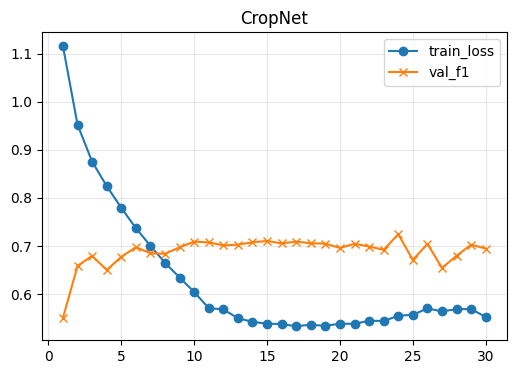

In [86]:
h = pd.read_csv(EXP_CROP / 'historial.csv')
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(h['epoch'], h['train_loss'], marker='o', label='train_loss')
ax.plot(h['epoch'], h['val_f1'], marker='x', label='val_f1')
ax.set_title('CropNet'); ax.legend(); plt.show()

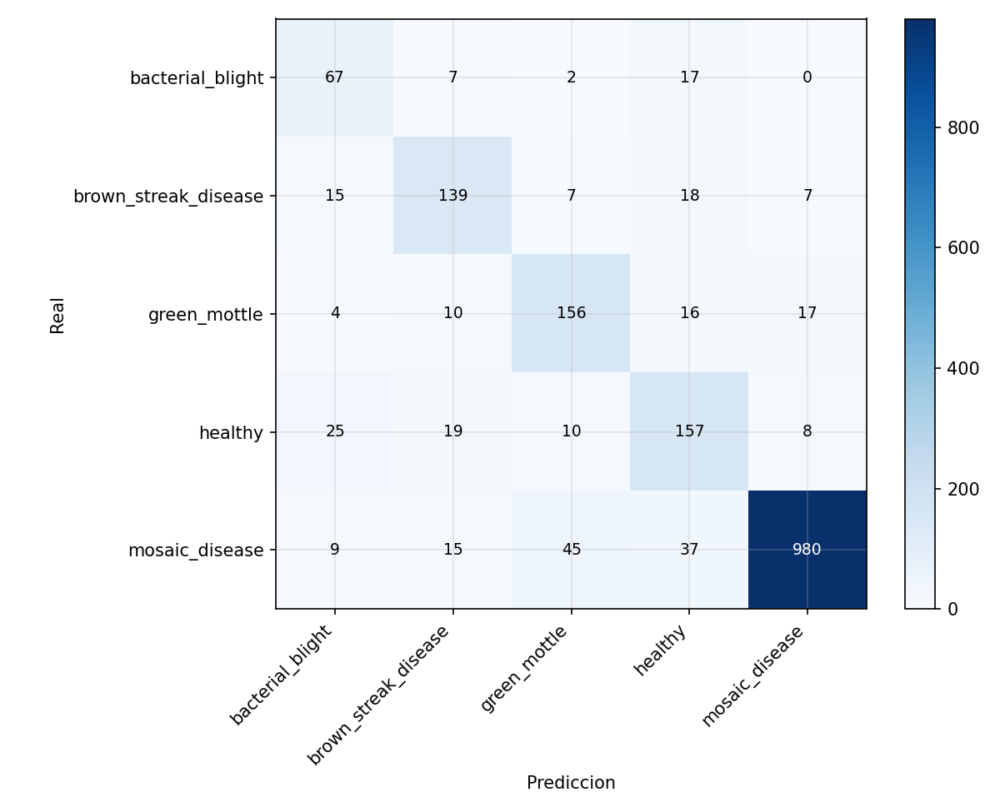

In [96]:
from IPython.display import Image

Image(filename="experimentos/cropnet/matriz_test.png")

### YOLO26

In [ ]:
EXP_YOLO = Path('experimentos/yolo26')
EXP_YOLO.mkdir(parents=True, exist_ok=True)

from ultralytics import YOLO
import shutil

YOLO_DATA = DATA / 'yolo_data'
spl = SPLITS / 'split_balanceado.csv' if (SPLITS / 'split_balanceado.csv').exists() else SPLITS / 'split_principal.csv'
df_bal = pd.read_csv(spl)

for split_name in ['train', 'val', 'test']:
    out = YOLO_DATA / split_name
    out.mkdir(parents=True, exist_ok=True)
    sub = df_bal[df_bal['split'] == split_name]
    for clase in CLASES: (out / clase).mkdir(exist_ok=True)
    if split_name == 'train':
        max_n = sub.groupby('label').size().max()
        for clase, grupo in sub.groupby('label'):
            repetidos = grupo.sample(max_n, replace=True, random_state=42)
            for idx, (_, row) in enumerate(repetidos.iterrows()):
                src_p = DATA / row['ruta']
                dst = out / row['label'] / f'{idx}_{src_p.name}'
                if not dst.exists(): dst.symlink_to(src_p.resolve())
    else:
        for _, row in sub.iterrows():
            src_p = DATA / row['ruta']
            dst = out / row['label'] / src_p.name
            if not dst.exists(): dst.symlink_to(src_p.resolve())

modelo_yolo = YOLO('yolo26-cls.pt')
res_yolo = modelo_yolo.train(data=str(YOLO_DATA), epochs=50, imgsz=224,
                              batch=64, seed=42, patience=5,
                              hsv_h=0.05, hsv_s=0.8, hsv_v=0.5,
                              degrees=20, translate=0.2, scale=0.5,
                              fliplr=0.5, flipud=0.3,
                              mosaic=1.0, mixup=0.2, erasing=0.4,
                              project=str(EXP_YOLO), name='entrenamiento')

weights_dir = Path(res_yolo.save_dir) / 'weights'
modelo_best = YOLO(str(weights_dir / 'best.pt'))

for f in ['best.pt', 'last.pt']:
    src_p = weights_dir / f
    if src_p.exists(): shutil.copy(src_p, EXP_YOLO / f)

print(f'YOLO guardado en: {EXP_YOLO}')

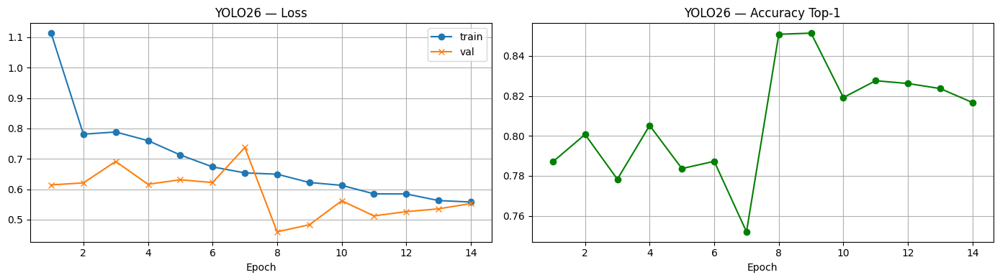

confusion_matrix.png


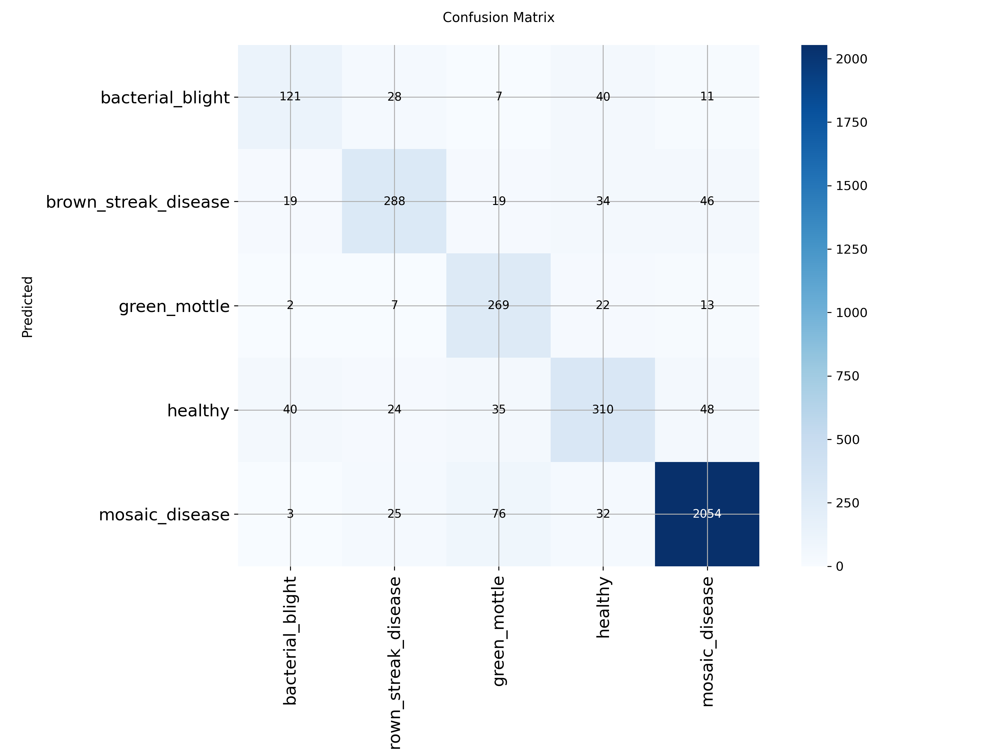

confusion_matrix_normalized.png


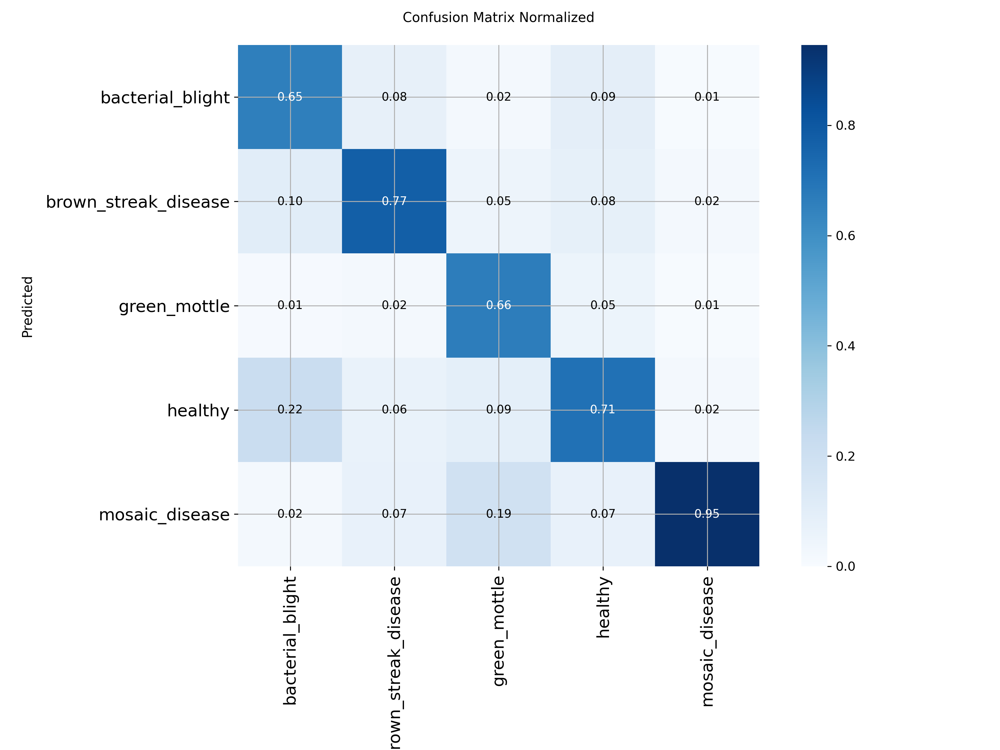

In [9]:
from pathlib import Path
from IPython.display import Image as MuestraImg

yolo_dir = Path('experimentos/yolo26/entrenamiento-4')
if (yolo_dir / 'results.csv').exists():
    h = pd.read_csv(yolo_dir / 'results.csv')
    fig, axs = plt.subplots(1, 2, figsize=(14, 4))
    axs[0].plot(h['epoch'], h['train/loss'], marker='o', label='train')
    axs[0].plot(h['epoch'], h['val/loss'], marker='x', label='val')
    axs[0].set_title('YOLO26 — Loss'); axs[0].set_xlabel('Epoch'); axs[0].legend()
    axs[1].plot(h['epoch'], h['metrics/accuracy_top1'], marker='o', color='green')
    axs[1].set_title('YOLO26 — Accuracy Top-1'); axs[1].set_xlabel('Epoch')
    fig.tight_layout(); plt.show()

for img_name in ['confusion_matrix.png', 'confusion_matrix_normalized.png']:
    ruta = yolo_dir / img_name
    if ruta.exists():
        print(f'{img_name}')
        display(MuestraImg(filename=str(ruta)))

### YOLO26 — Grid predicciones (val)

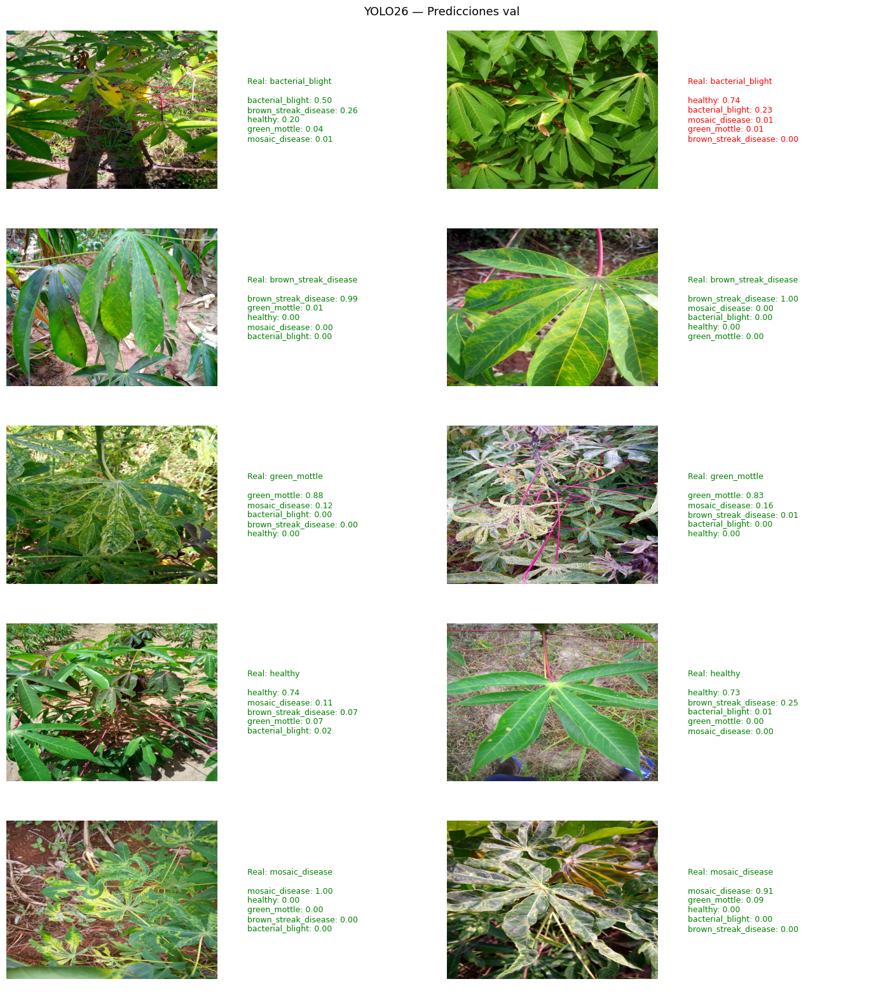

In [13]:
from ultralytics import YOLO


modelo_vis = YOLO(str(yolo_dir / 'weights' / 'best.pt'))

val_dir = DATA / 'yolo_data' / 'val'
ejemplos = []
for c in CLASES:
    imgs = sorted((val_dir / c).glob('*.jpg'))[:2]
    for img in imgs: ejemplos.append((img, c))

preds = modelo_vis([str(e[0]) for e in ejemplos], verbose=False)
fig, axs = plt.subplots(5, 4, figsize=(14, 16))
for i, (img_path, real) in enumerate(ejemplos):
    row = i // 2
    col = (i % 2) * 2
    axs[row, col].imshow(Image.open(img_path))
    axs[row, col].axis('off')
    probs = preds[i].probs
    top5 = probs.top5
    texto = '\n'.join([f'{CLASES[t]}: {probs.top5conf[j]:.2f}' for j, t in enumerate(top5)])
    axs[row, col+1].text(0.1, 0.5, f'Real: {real}\n\n{texto}', fontsize=9, va='center',
                          color='green' if CLASES[top5[0]] == real else 'red')
    axs[row, col+1].axis('off')
fig.suptitle('YOLO26 — Predicciones val', fontsize=13)
fig.tight_layout(); plt.show()

### YOLO26 — Evaluación test + predicciones

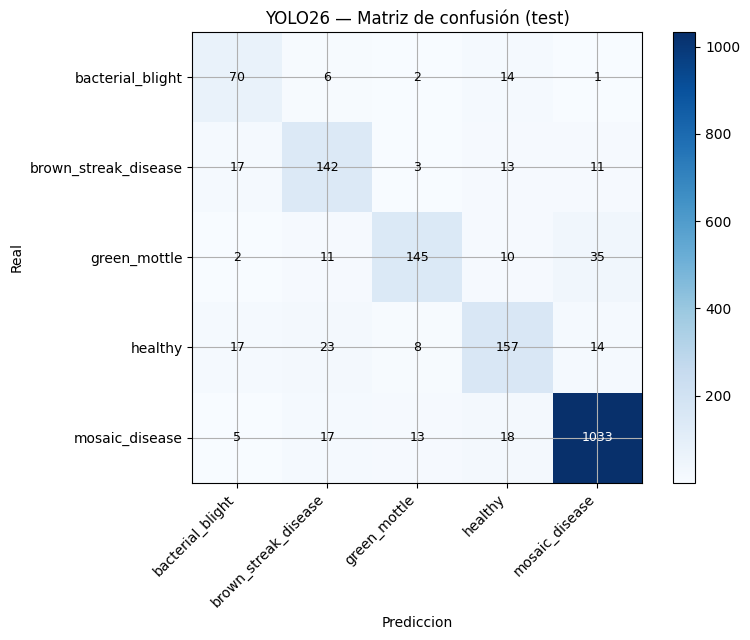

Accuracy: 0.866 | F1 macro: 0.775 | F1 weighted: 0.866
predicciones.csv: 3207 filas


label
mosaic_disease          1987
brown_streak_disease     390
healthy                  375
green_mottle             286
bacterial_blight         169
Name: count, dtype: int64

In [14]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, precision_recall_fscore_support

modelo_eval = YOLO(str(yolo_dir / 'weights' / 'best.pt'))

spl = SPLITS / 'split_balanceado.csv' if (SPLITS / 'split_balanceado.csv').exists() else SPLITS / 'split_principal.csv'
df_sp = pd.read_csv(spl)
df_test = df_sp[df_sp['split'] == 'test']

rutas_test = [str(DATA / r) for r in df_test['ruta']]
y_true = [CLASES.index(l) for l in df_test['label']]

BATCH = 32
y_pred = []
for i in range(0, len(rutas_test), BATCH):
    preds = modelo_eval(rutas_test[i:i+BATCH], verbose=False)
    y_pred.extend([p.probs.top1 for p in preds])
    torch.cuda.empty_cache()

acc = accuracy_score(y_true, y_pred)
f1m = f1_score(y_true, y_pred, average='macro', zero_division=0)
f1w = f1_score(y_true, y_pred, average='weighted', zero_division=0)
p_c, r_c, f1_c, _ = precision_recall_fscore_support(y_true, y_pred, average=None, zero_division=0)

yolo_salidas = Path('experimentos/yolo26')
pd.DataFrame({'clase': CLASES + ['exactitud', 'f1_macro', 'f1_ponderado'],
              'precision': list(p_c)+[acc,acc,f1m], 'recall': list(r_c)+[acc,acc,f1m],
              'f1': list(f1_c)+[acc,f1m,f1w]}).to_csv(yolo_salidas / 'metricas_test.csv', index=False)

cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(8, 6.5))
im = ax.imshow(cm, cmap='Blues')
ax.set_xticks(range(len(CLASES)), CLASES, rotation=45, ha='right')
ax.set_yticks(range(len(CLASES)), CLASES)
for i in range(len(CLASES)):
    for j in range(len(CLASES)):
        ax.text(j, i, int(cm[i,j]), ha='center', va='center',
                color='white' if cm[i,j] > cm.max()/2 else 'black', fontsize=9)
ax.set_title('YOLO26 — Matriz de confusión (test)')
ax.set_xlabel('Prediccion'); ax.set_ylabel('Real')
fig.colorbar(im, ax=ax, fraction=0.046)
fig.tight_layout(); fig.savefig(yolo_salidas / 'matriz_test.png', dpi=150); plt.show()

print(f'Accuracy: {acc:.3f} | F1 macro: {f1m:.3f} | F1 weighted: {f1w:.3f}')

test_files = sorted((DATA / 'test').glob('*.jpg'))
predicciones = []
for i in range(0, len(test_files), BATCH):
    batch = test_files[i:i+BATCH]
    preds_ext = modelo_eval([str(f) for f in batch], verbose=False)
    for f, p in zip(batch, preds_ext):
        predicciones.append({'image_id': f.name, 'label': CLASES[p.probs.top1]})
    torch.cuda.empty_cache()

df_pred = pd.DataFrame(predicciones)
df_pred.to_csv('predicciones_yolo26.csv', index=False)
print(f'predicciones_yolo26.csv: {len(df_pred)} filas')
display(df_pred['label'].value_counts())

## Comparación

In [16]:
experimentos = {}
for d in sorted(Path('experimentos').iterdir()):
    if d.is_dir(): experimentos[d.name] = str(d)

def leer_metricas(d):
    r = {}
    for split in ['val', 'test']:
        ruta = Path(d) / f'metricas_{split}.csv'
        if ruta.exists():
            df = pd.read_csv(ruta).set_index('clase')
            r[split] = (float(df.loc['exactitud', 'f1']), float(df.loc['f1_macro', 'f1']))
    return r

filas = []
for nombre, directorio in experimentos.items():
    f = {'modelo': nombre}
    m = leer_metricas(directorio)
    if 'test' in m: f['test_acc'], f['test_f1'] = m['test']
    filas.append(f)

comparacion = pd.DataFrame(filas).sort_values('test_f1', ascending=False) if filas else pd.DataFrame()
display(comparacion.round(4)) if not comparacion.empty else print('Sin resultados aun.')

,modelo,test_acc,test_f1
1,yolo26,0.8657,0.7751
0,cropnet,0.8388,0.7434


### Mejor modelo — Predicciones test externo

Modelo: YOLO26
predicciones_yolo26.csv: 3207 filas


label
mosaic_disease          1987
brown_streak_disease     390
healthy                  375
green_mottle             286
bacterial_blight         169
Name: count, dtype: int64

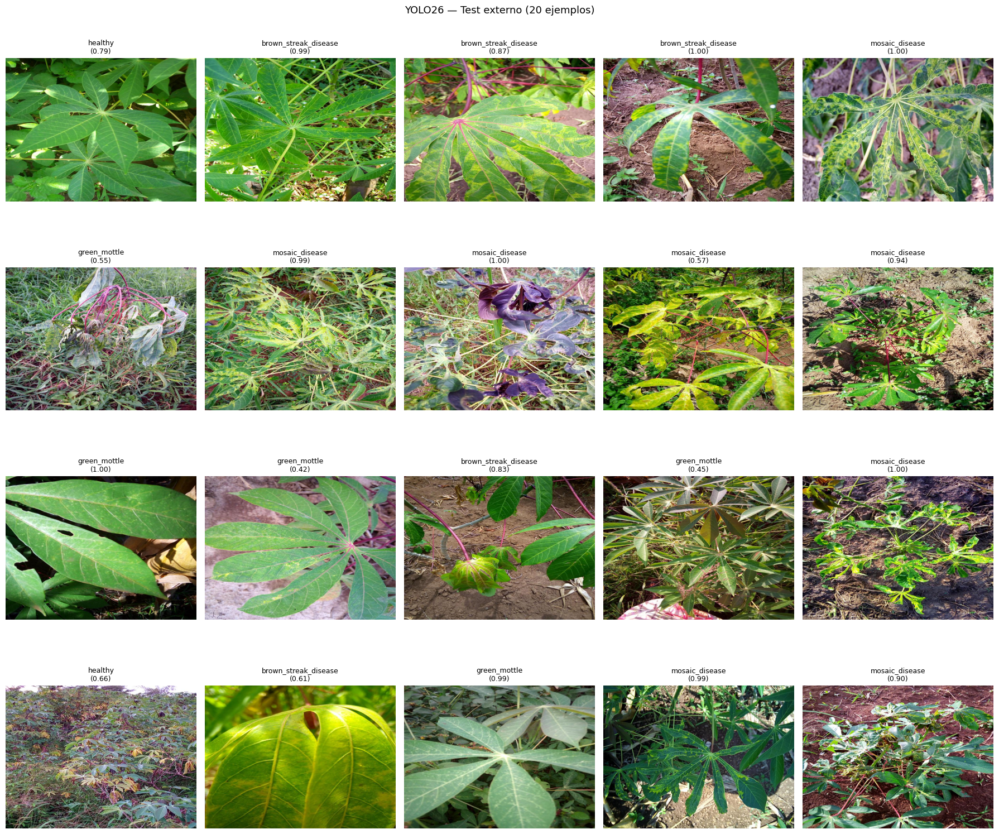

In [18]:
from ultralytics import YOLO

YOLO_PATH = Path('experimentos/yolo26/entrenamiento-4/weights/best.pt')
modelo_final = YOLO(str(YOLO_PATH))
print(f'Modelo: YOLO26')

BATCH = 32
test_files = sorted((DATA / 'test').glob('*.jpg'))
predicciones = []
for j in range(0, len(test_files), BATCH):
    batch = test_files[j:j+BATCH]
    preds = modelo_final([str(f) for f in batch], verbose=False)
    for f, p in zip(batch, preds):
        predicciones.append({'image_id': f.name, 'label': CLASES[p.probs.top1],
                              'conf': float(p.probs.top1conf)})
    torch.cuda.empty_cache()

df_pred = pd.DataFrame(predicciones)
df_pred.to_csv('predicciones_yolo26.csv', index=False)
print(f'predicciones_yolo26.csv: {len(df_pred)} filas')
display(df_pred['label'].value_counts())

n = 20
cols = 5
rows = n // cols
fig, axs = plt.subplots(rows, cols, figsize=(18, 4*rows))
for j in range(n):
    r, c = j // cols, j % cols
    axs[r, c].imshow(Image.open(DATA / 'test' / predicciones[j]['image_id']))
    axs[r, c].set_title(f"{predicciones[j]['label']}\n({predicciones[j]['conf']:.2f})", fontsize=9)
    axs[r, c].axis('off')
fig.suptitle('YOLO26 — Test externo (20 ejemplos)', fontsize=13)
fig.tight_layout(); plt.show()

## Conclusiones

- Se probaron modelos entrenados desde cero (redes propias) pero fueron mucho peor que los pre-entrenados y se omitieron aquí.
- Se probaron otros modelos pre-entrenados (EfficientNet, ResNet, ConvNeXt, MobileNetV3) con menor rendimiento.
- YOLO26 es uno de los modelos más recientes pre-entrenados, diseñado para adaptarse a problemas de clasificación